# 0. Importing Necessary Libraries

In [101]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import warnings
warnings.filterwarnings('ignore') 
from datetime import datetime
from sklearn.neighbors import KNeighborsRegressor
import random

# 1. Reading the datasets

  ##    1.1 Reading the final cleaned data

In [9]:
data = pd.read_csv('walmart_final.csv')
data.head()

,Date,Store,IsHoliday,Weekly_Sales,Temperature,Fuel_Price,CPI,Unemployment,Size,Total_Markdown,...,93.0,94.0,95.0,96.0,97.0,98.0,99.0,Type_1,Type_2,Type_3
0,2010-02-05,1,0,0.122377,0.122844,0.041637,0.8405,0.405118,0.630267,0.0,...,0,0,0,0,0,0,0,0,0,1
1,2010-02-05,1,0,0.057628,0.122844,0.041637,0.8405,0.405118,0.630267,0.0,...,0,0,0,0,0,0,0,0,0,1
2,2010-02-05,1,0,0.064927,0.122844,0.041637,0.8405,0.405118,0.630267,0.0,...,0,0,0,0,0,0,0,0,0,1
3,2010-02-05,1,0,0.000184,0.122844,0.041637,0.8405,0.405118,0.630267,0.0,...,0,0,0,0,0,0,0,0,0,1
4,2010-02-05,1,0,0.005329,0.122844,0.041637,0.8405,0.405118,0.630267,0.0,...,0,0,0,0,0,0,0,0,0,1


## 1.2 Reading the store wise data

In [ ]:
stores_data = []
path = "store-data"

print("--------------- Starting Execution -------------")


for i in range(1, 46):
    store = pd.read_csv(f"{path}/Store_{i}.csv")
    store["Date"] = pd.to_datetime(store["Date"])
    store = store.set_index("Date")
    print(f"Read: Store_{i}.csv")
    stores_data.append(store)
    
    
print("---------------- End of Execution -------------") 

# 3. Some Preprocesing before implementing KNN

In [ ]:
data["Date"] = pd.to_datetime(data["Date"]) # convert to datetime

data['week'] =data['Date'].dt.week # Creating a column for weeks

data['month'] =data['Date'].dt.month # Creating a column for months

data = data.set_index("Date") # Setting the index

# 4. Take a look of the data

## 4.1 The whole data

In [5]:
data.head()

,Store,IsHoliday,Weekly_Sales,Temperature,Fuel_Price,CPI,Unemployment,Size,Total_Markdown,1.0,...,95.0,96.0,97.0,98.0,99.0,Type_1,Type_2,Type_3,week,month
Date,,,,,,,,,,,,,,,,,,,,,
2010-02-05,1,0,0.122377,0.122844,0.041637,0.840500,0.405118,0.630267,0.000000,1,...,0,0,0,0,0,0,0,1,5,2
2010-02-05,1,0,0.057628,0.122844,0.041637,0.840500,0.405118,0.630267,0.000000,0,...,0,0,0,0,0,0,0,1,5,2
2010-02-05,1,0,0.064927,0.122844,0.041637,0.840500,0.405118,0.630267,0.000000,0,...,0,0,0,0,0,0,0,1,5,2
2010-02-05,1,0,0.000184,0.122844,0.041637,0.840500,0.405118,0.630267,0.000000,0,...,0,0,0,0,0,0,0,1,5,2
2010-02-05,1,0,0.005329,0.122844,0.041637,0.840500,0.405118,0.630267,0.000000,0,...,0,0,0,0,0,0,0,1,5,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2012-10-26,45,0,0.108989,0.590431,0.865399,0.654796,0.458884,0.451136,0.062609,0,...,0,0,0,0,0,0,1,0,43,10
2012-10-26,45,0,0.011048,0.590431,0.865399,0.654796,0.458884,0.451136,0.062609,0,...,0,0,0,0,0,0,1,0,43,10
2012-10-26,45,0,0.017160,0.590431,0.865399,0.654796,0.458884,0.451136,0.062609,0,...,0,0,0,0,0,0,1,0,43,10


## 4.2 A random store data

In [ ]:
stores_data[random.randint(0,45)]

# 5. Implementing KNN for the whole Data

## 5.1 Subseting and creating a dataframe for storing necessary datas

In [329]:
X = data.drop(['Store','Weekly_Sales'], axis=1) # Dropping Store and Weekly_Sales to reduce the bias

Y = data.Weekly_Sales 

DF = pd.DataFrame(Y)

## 5.2 Fitting KNN

In [330]:
nbrs =KNeighborsRegressor(n_neighbors = 7) # taking k = 7

nbrs.fit(X,Y) # WARNING! It may take a lot of time

predicted=nbrs.predict(X) # WARNING! It may take a lot of time

## 5.3 Storing necessary datas in the data frame for future works

In [334]:
DF['Predicted_Sales'] = predicted # For storing the predicted Weekly_Sales

DF["Absolute_Error"] = np.abs(
    DF['Weekly_Sales'] - DF['Predicted_Sales']) # Using the absolute error for the loss estimation

## 5.4 Plotting Weekly_Sales ; Predicted_Sales and Absolute_Error

<AxesSubplot:title={'center':'Weekly_Sales v/s Predicted_Sales with Absolute_Error'}, xlabel='Date'>

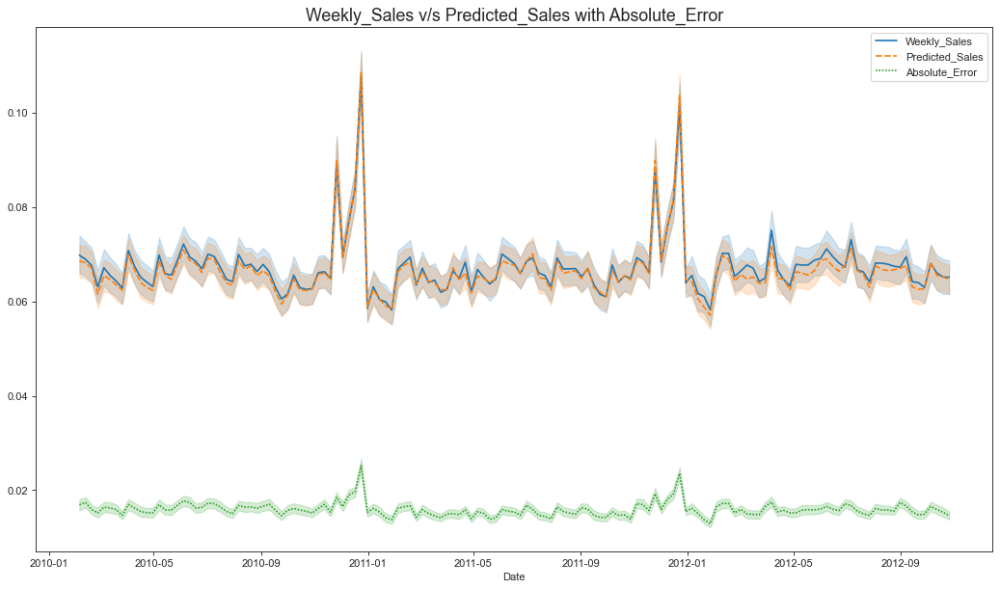

In [335]:
sns.set_style("ticks")

plt.figure(figsize=(16,9), 
           dpi=80)

plt.title('Weekly_Sales v/s Predicted_Sales with Absolute_Error', 
          fontsize=16)

sns.lineplot(data=DF)

## 5.5 Plottin the Error Distribution

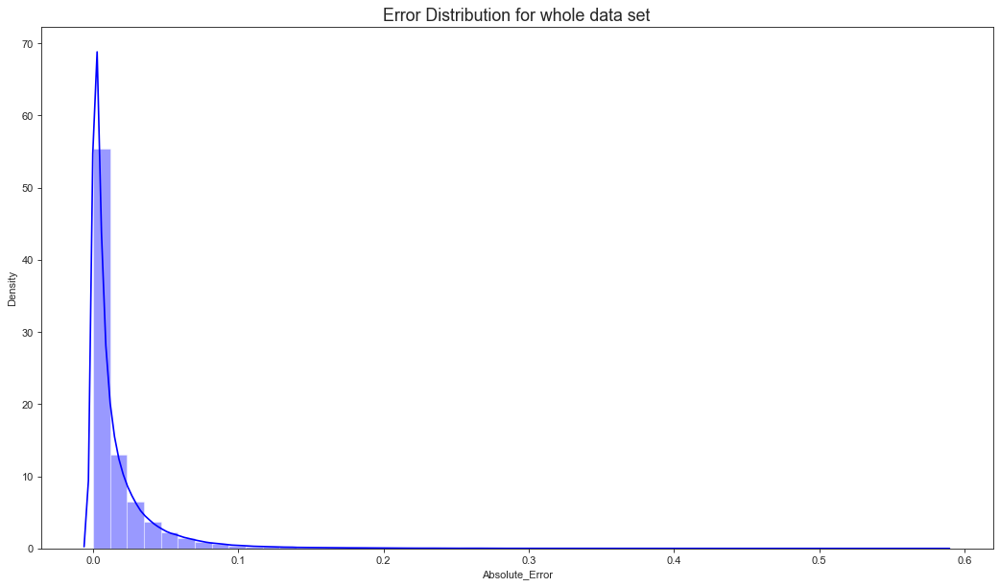

In [360]:
plt.figure(figsize=(16,9), 
           dpi=80)

plt.title('Error Distribution for whole data set',
          fontsize=16)

sns.distplot(DF.Absolute_Error,
             kde= True,
             color = 'blue')

plt.show()

## 5.6 Calculating threshold

### 5.6.1 Creating the MAD function to estimate the threshold

In [ ]:
def mad(x):
    md = 1.4826*np.median(np.abs(x - np.median(x)))
    tmax = np.median(x) + 20.5*md # tmax = np.median(x) + q * md ; we can change q
    return tmax

### 5.6.2 Calculation the threshold

In [406]:
Threshold = mad(DF.Absolute_Error)
Threshold

0.1718660542804874

## 5.7 Calculating anomalies for the whole data Set

In [407]:
threshold = Threshold

DF['Anomaly'] = DF['Absolute_Error'] > threshold

Anomalies = DF[DF['Anomaly'] == True]

total_anomalies = len(Anomalies)

print('Total anomalies in the whole data set are = ',total_anomalies)

Total anomalies in the whole data set are =  2127


## 5.7 Final plot

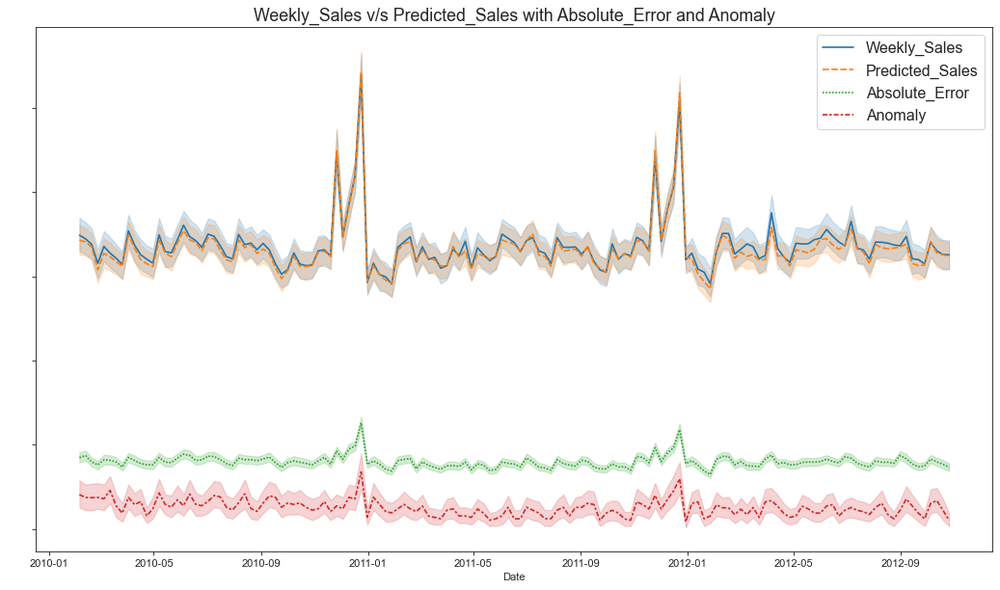

In [427]:
sns.set_style("ticks")

plt.figure(figsize=(16,9), 
           dpi=80)

plt.title('Weekly_Sales v/s Predicted_Sales with Absolute_Error and Anomaly', 
          fontsize=16)

plt.yticks(color='w')

sns.lineplot(data=DF)
plt.legend(fontsize='x-large')

#plt.savefig(f'final_plot_for_whole_dataset.png')

## 5.7 Saving the the resultant dataset

In [414]:
# DF_2 = pd.concat([data.drop('Weekly_Sales',axis =1), DF],
#                   axis = 1)
#DF_2.to_csv('Output_KNN_Whole.csv')

# 6. Calculation anomalies for each store

No. of anomalies for store no.1 is 46
The threshold for store 1 is 0.24968743002965216
No. of anomalies for store no.2 is 46
The threshold for store 2 is 0.20437222136881167
No. of anomalies for store no.3 is 145
The threshold for store 3 is 0.11066916587032763
No. of anomalies for store no.4 is 30
The threshold for store 4 is 0.1933030468871096
No. of anomalies for store no.5 is 74
The threshold for store 5 is 0.1340694470395296
No. of anomalies for store no.6 is 32
The threshold for store 6 is 0.14694260719399063
No. of anomalies for store no.7 is 16
The threshold for store 7 is 0.11139925484232782
No. of anomalies for store no.8 is 33
The threshold for store 8 is 0.20059001094726353
No. of anomalies for store no.9 is 44
The threshold for store 9 is 0.16591036546421684
No. of anomalies for store no.10 is 66
The threshold for store 10 is 0.08391403874412343
No. of anomalies for store no.11 is 23
The threshold for store 11 is 0.18374129305633657
No. of anomalies for store no.12 is 22
T

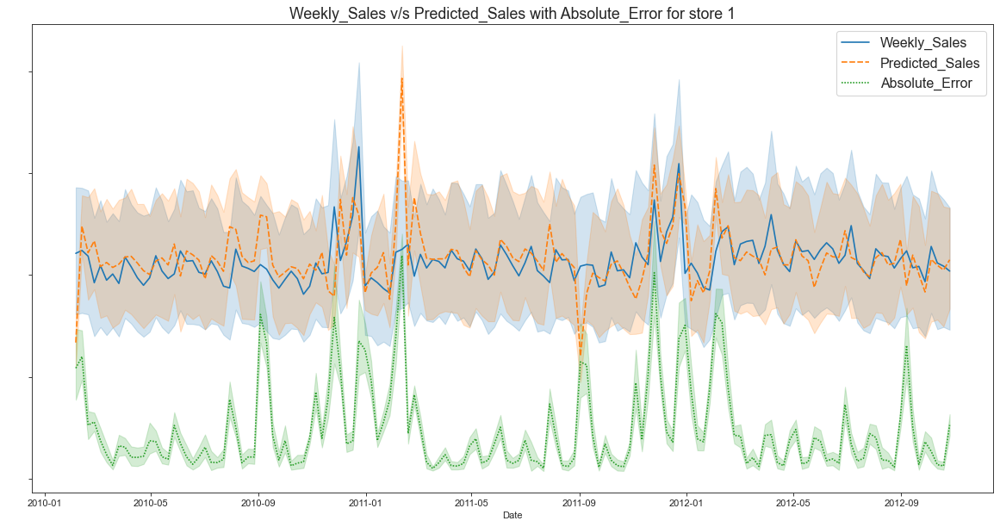

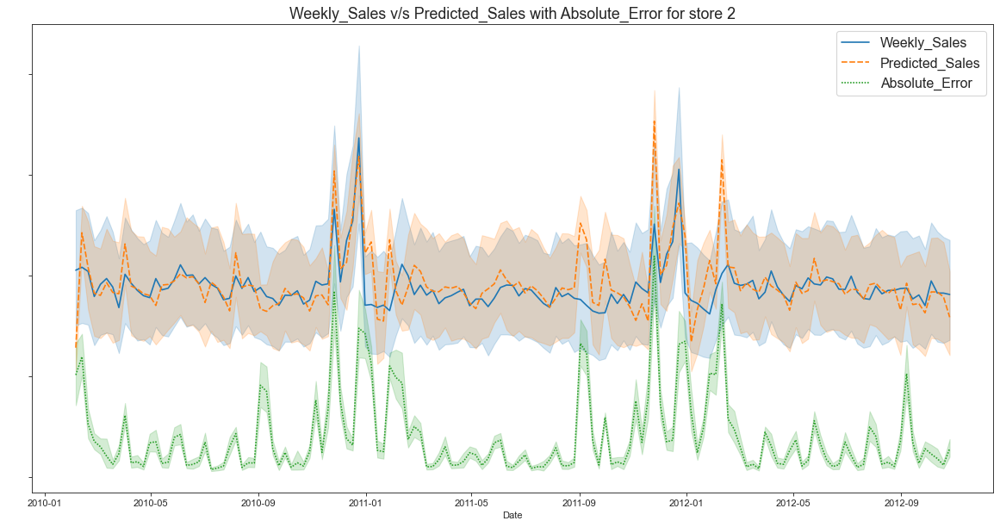

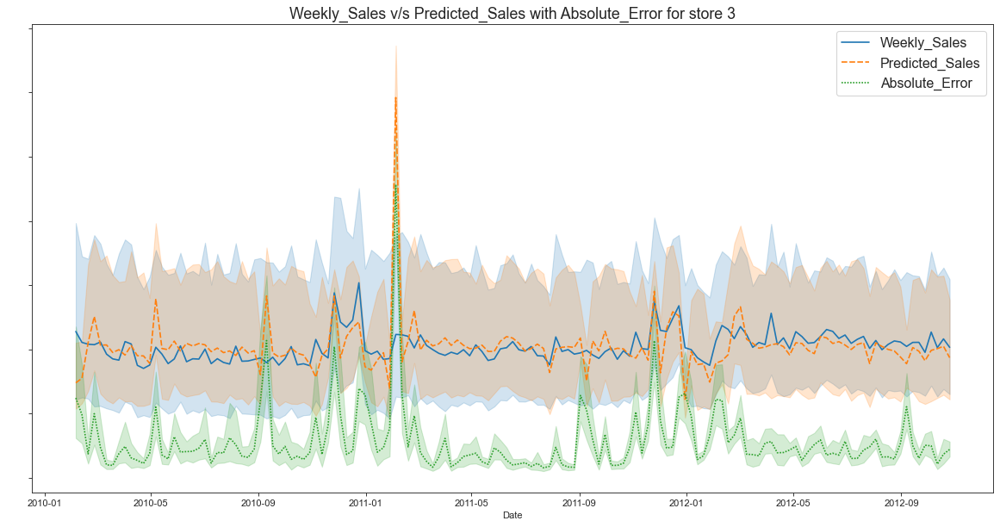

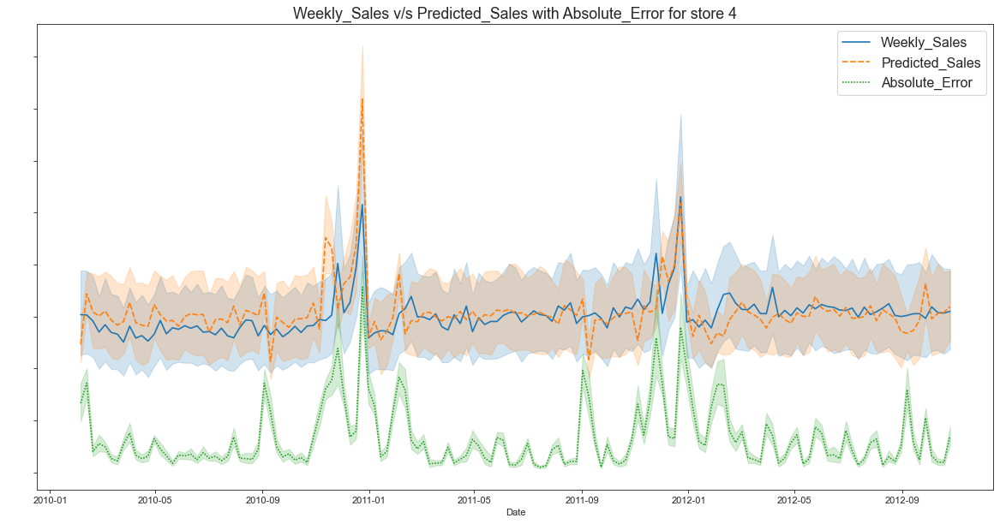

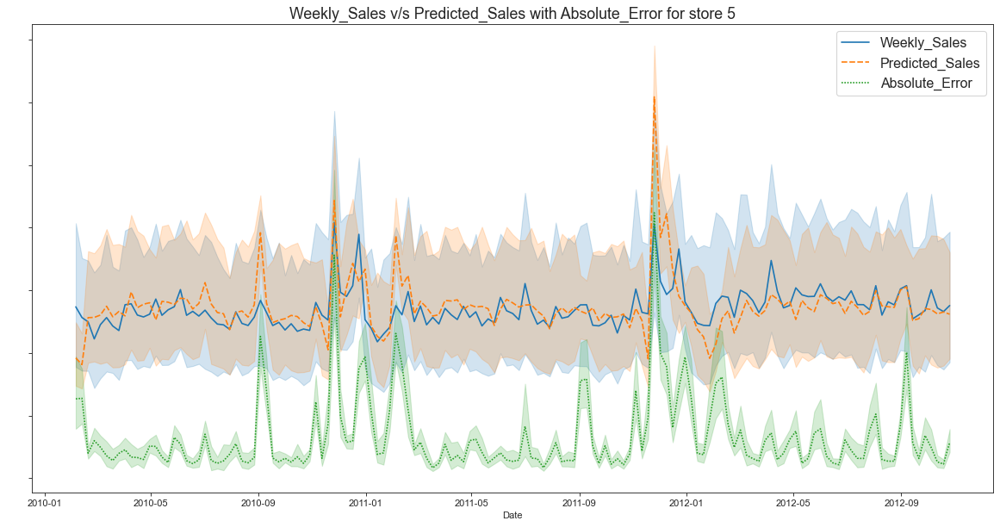

...

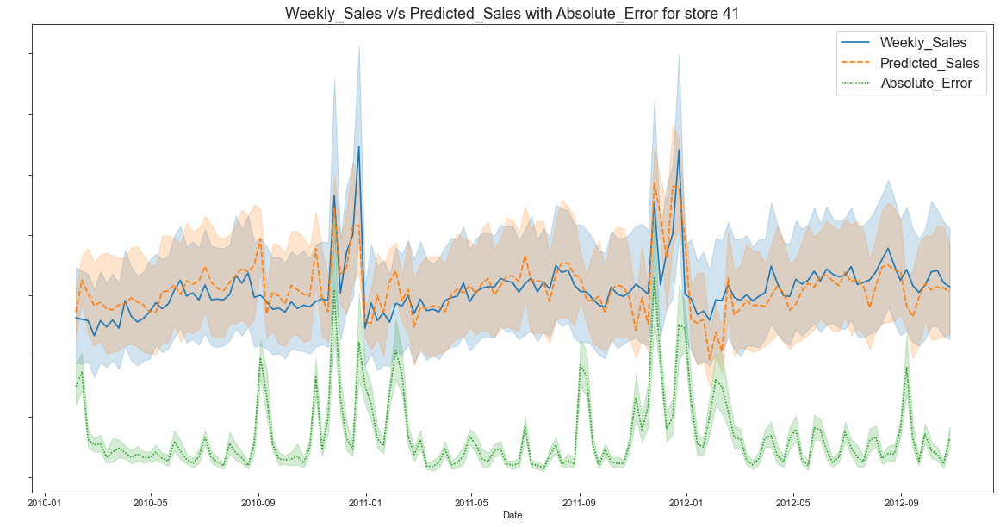

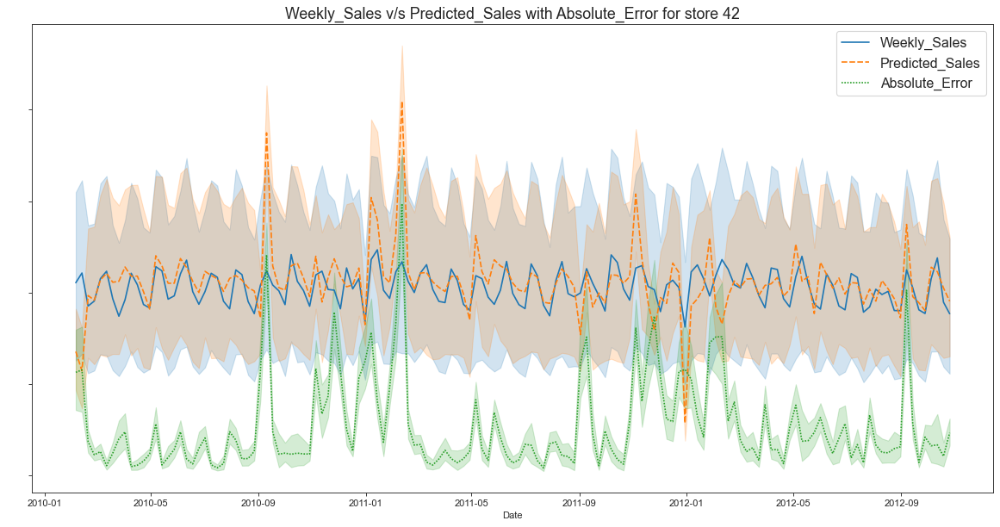

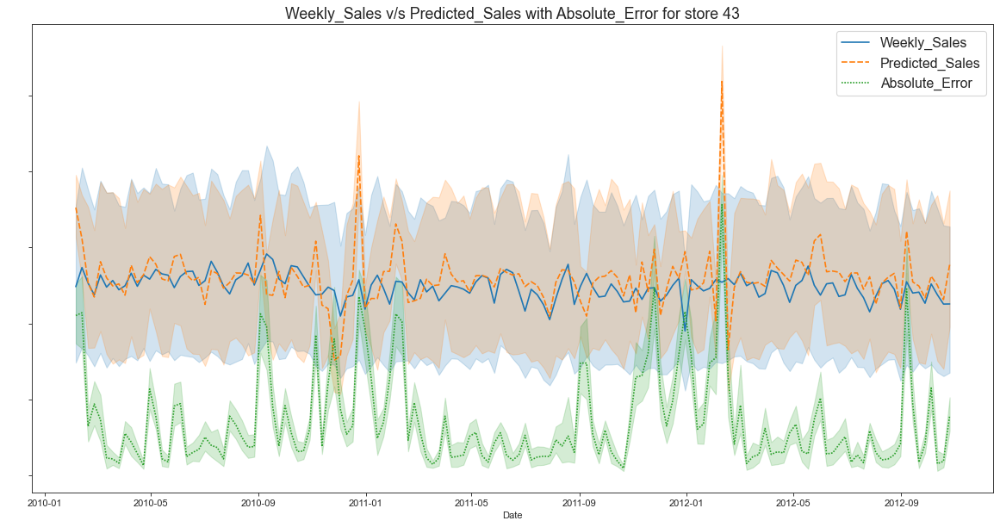

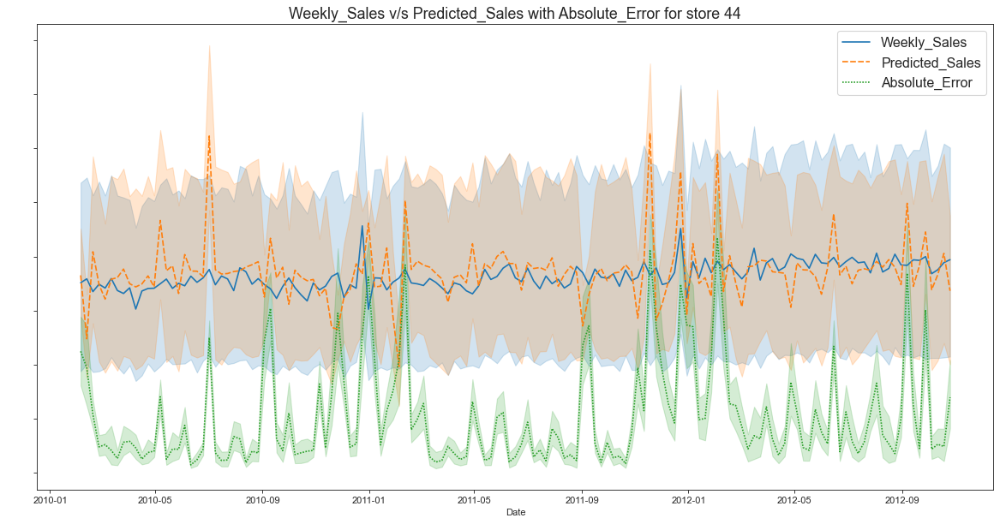

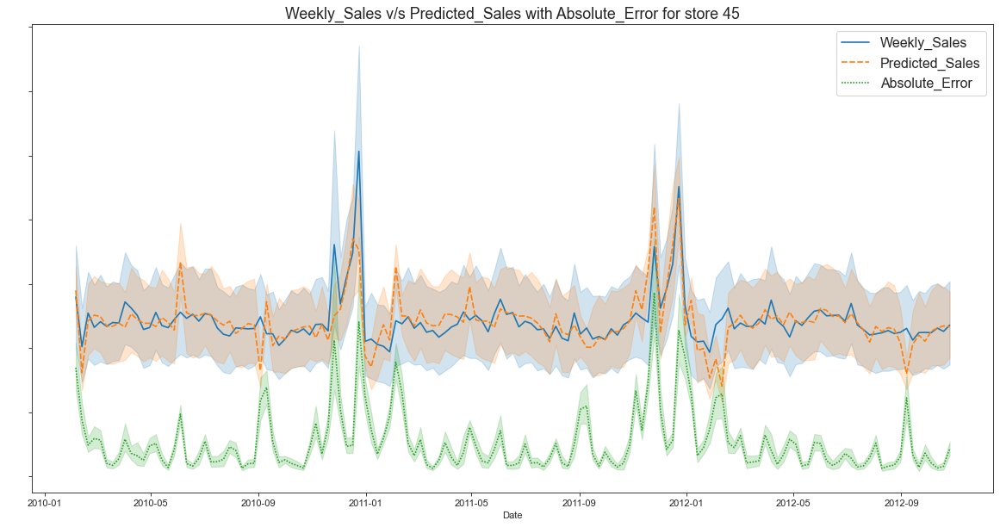

In [430]:
k = 0
total_anomaly_no = 0
for store_data in stores_data:
    Y = store_data.Weekly_Sales
    df = pd.DataFrame(Y)
    X = store_data.drop(['Store','Weekly_Sales'], axis=1)
    
    nbrs.fit(X,Y)
    pred=nbrs.predict(X)
    df['Predicted_Sales'] = pred
    df["Absolute_Error"] = np.abs(df['Weekly_Sales'] - df['Predicted_Sales'])
    
    Threshold = mad(df.Absolute_Error)
    threshold = Threshold
    
    df['Anomaly'] = df['Absolute_Error'] > threshold
    Anomalies = df[df['Anomaly'] == True]
    total_anomalies = len(Anomalies)
    
    k += 1
    
    print(f"No. of anomalies for store no.{k} is {total_anomalies}")
    print(f"The threshold for store {k} is {threshold}")
    
    plt.figure(figsize=(18,9), dpi=80)
    plt.title(f'Weekly_Sales v/s Predicted_Sales with Absolute_Error for store {k}', fontsize=16)
    plt.yticks(color='w')
    sns.lineplot(data=df[['Weekly_Sales', 'Predicted_Sales', 'Absolute_Error']])
    plt.legend(fontsize='x-large')
#    plt.show()
    
#    plt.savefig(f'store {k}.png')
    
    total_anomaly_no += total_anomalies
    
#     df_2 = pd.concat([store_data.drop('Weekly_Sales',axis =1), df],
#                   axis = 1)
    
    
    #df_2.to_csv(f'Output_KNN_store {k}.csv')
    
    
print('Total Anomalies =',total_anomaly_no)